# HERA Memo: A Physical Model for the H1C Cross-Talk Systematic

**Josh Dillon$^\dagger$ (UC Berkeley), Aaron Parsons (UC Berkeley), and Nicholas Kern (MIT)**

$^\dagger$ [jsdillon@berkeley.edu](mailto:jsdillon@berkeley.edu)

*Note: this memo is executable at NRAO, but for readability all the code appears at the bottom. [A notebook version is available on github.](https://github.com/HERA-Team/hera_sandbox/tree/master/jsd/Crosstalk_Memo/Crosstalk_Physical_Model_Memo.ipynb) Run the code in the appendix below before running the plotting functions within the text.*

## I. Introduction

One of the most important systematics plaguing the H1C data is an apparent cross-coupling between antennas that produces substantial spectral structure in virtually all visibilities. This was examined in depth in [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf) and in two subsequent papers: [Kern et al. (2019a)](https://arxiv.org/abs/1909.11732) and [Kern et al. (2019b)](https://arxiv.org/abs/1909.11732). These papers, along with the validation of the [HERA Collaboration (2021)](https://arxiv.org/abs/2108.02263) limits in [Aguirre et al. (2021)](https://arxiv.org/abs/2104.09547), show that the systematic can be effectively mitigated by modeling it as a non-fringing component of the observed visibility and subtracting the fringe-rates near 0. With the exception of baselines with short projected East-West distances, this works quite well. An example of this cross-talk is shown in Figure 1.

<IPython.core.display.Javascript object>


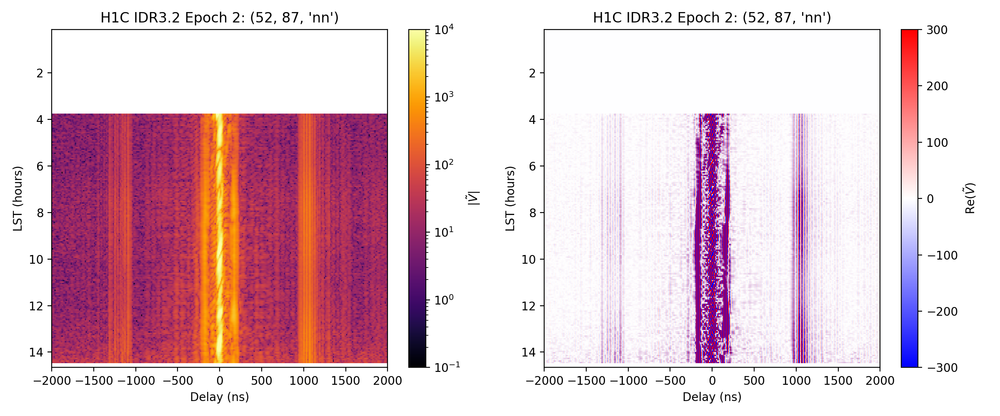

In [27]:
xtalk_example()    

### Figure 1: Example cross-talk
**Here we show an example of the cross-talk in delay space, both the absolute value and the real part. The effect produces relatively large non-fringing spectral structure between 800 and ~1500 ns. Different baselines see different amplitudes and delay profiles of the effect.**


In [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf), it is postulated that the effect seen could be explained by allowing the measured voltages in a given antenna to be coupled to other antennas. Namely,

$v_i' = v_i + \sum_{n\neq i} \epsilon_{ni} v_n $,

and hence

$V'_{ij} = \langle v_i' v_j'^* \rangle = \langle (v_i + \sum_{n\neq i}\epsilon_{ni} v_n)(v_j + \sum_{n \neq j}\epsilon_{nj} v_n)^* \rangle$.

In principle, all antennas are be coupled to all others. In practice, the most important couplings are the ones between the two antennas in a given visibility, since they lead to first-order terms in $\epsilon$ that leak autocorrelations into the cross-correlations. If we neglect those terms, then we can write a visibility as:

$V'_{ij} \approx \langle v_i v_j* + \epsilon_{ij}^* v_i v_i^* + \epsilon_{ji} v_j  v_j^* + \epsilon_{ji}\epsilon_{ij}^* v_i^* v_j \rangle = V_{ij} + \epsilon_{ij}^* V_{ii} +  \epsilon_{ji} V_{jj} +  \epsilon_{ji}\epsilon_{ij}^* V_{ij}^* \approx V_{ij} + \epsilon_{ij}^* V_{ii} +  \epsilon_{ji} V_{jj}$

where in the last approximate equality, we have droped the $\mathcal{O}(\epsilon^2)$ term. What we are left with is the original visibility with small amounts of the very bright autocorrelations from each of the two participating antennas leaking in.

While this basic model appears correct, the exactly physical mechanism eluded us. [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf) presents and rejects four models for the cross-talk:

1. A single noise source in the field was rejected because it cannot produce the high delays longer than the geometric horizon of the baseline.
2. Feed-to-feed reflections with a reflection at the receiverator were rejected because it predicted very specific delays (light travel time down and back up the cable) that were inconsistent with the observed delays of the cross-talk systematic.
3. Cable reflection followed by signal broadcasting was rejected because it was essentially the same as 2, just with a swapped order.
4. A single broadcasting antenna with a shortened cable was rejected because it would have predicted (nearly) symmetric structure in the cross-talk at positive and negative delays.

[HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf) got closest to discovering what we believe is the correct mechanism in Figures 16 and 17 and the surrounding text. Attributing positive or negative delays to the first and second antennas in a baseline (or vice versa) reveals interesting patterns in the dependence of the delay and amplitude of the cross-talk peak on position in the array. 

## II. Our model: signals from every antenna broadcast via the receiverator and/or the correlator.

In the H1C system, the voltage signal from each antenna is amplified by the LNA and transmitted down the ~150 m cable to a receiverator that houses a second stage of amplification. Afterwards, the signal is transmitted over another ~20 m cable to the container housing the correlator. 

We now believe that  each antenna's voltage signal was also emitted from a single point or a few nearby points on the West side of the array near the receiverator (see Figure 2), transmitted over the air, and received at every other antenna. In any given visibility observation, $V_{ij}$, the component of the voltage signal from antenna $i$ received by antenna $j$ should show up looking like a copy of $V_{ii}$ at a negative delay explained by the sum of the light travel time down the cable and the light travel time back over the air. 

One possible explanation for the leakage (or at least a contributing factor to it) is the known impedence mismatch in retrofitting the PAM for the legacy 75 $\Omega$ PAPER hardware. 

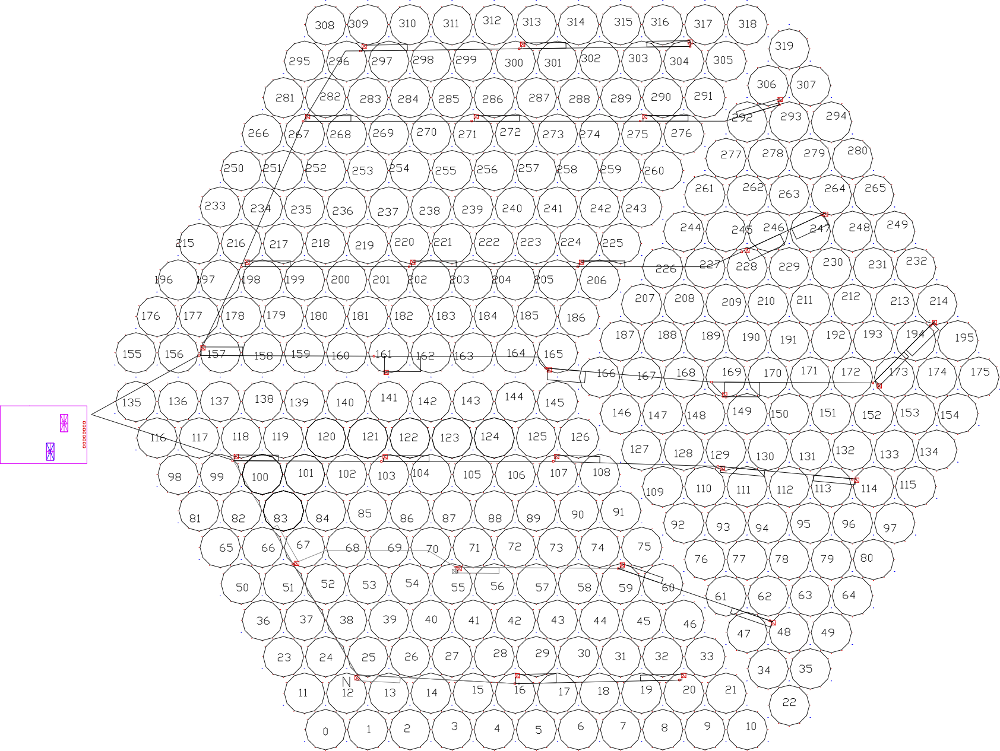

In [28]:
Image('/lustre/aoc/projects/hera/jsdillon/H1C_IDR3/heraSite.png', width=750)

### Figure 2: The HERA site
**Here we show a schematic of the HERA site. This shows the final antenna positions and node positions for Phase II, though it also shows the location of the key signal chain elements in Phase I on the West side of the array: the correlator container (small pink rectangle) and the receiverators (small red squares).**


In our model, $\epsilon_{ij} \approx A_i \exp[2\pi i \nu (\tau_{i,cable} + \tau_{X\rightarrow j})]$ where $A_i$ is the amplitude of the emission relative to the autocorrelation, $\tau_{i,cable}$ is the light travel time down the cable connecting antenna $i$ to the receiverator, and $\tau_{X\rightarrow j}$ is the over-the-air light travel time from the emitter to antenna $j$. 

Of course, it is probably not that simple. While we can easily predict $\tau_{i,cable}$ as half the cable reflection timescale measured from the autocorrelations, we do not know for sure whether there is any additional delay inside the receiverator or in the cable between the receiverator and the correlator. Likewise, we expect that $\tau_{X\rightarrow j}$ is not a single timescale but rather many, considering how many different paths an electromagnetic signal might take from the emitter to antenna $j$.  The amplitude may also be frequency (and thus delay) dependent. 

However, if we assume that the peak of the cross-talk in any given baseline is due to the simplest form of this mechanism, then we can attempt to use the measured cross-talk amplitudes and delays, along with the cable-reflection delays, to estimate the location of the emitter. 

## III. Explaining the peak delay of the crosstalk

We begin our analysis by revisiting the peak delays and amplitudes examined in [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf). Identifying the peaks is a bit tricky. We examine epoch 2 of H1C IDR3 data (see [HERA Memo #97](http://reionization.org/manual_uploads/HERA097_H1C_IDR3_2_Memo.pdf)), where we take flagged and in-painted data, FFT it with a Blackman-Harris window (excluding the first and last 100 channels), and then average it in time. We then identify delay/amplitude peaks at both negative and positive delays above $|\tau| > 600$ ns. We use $3000 > |\tau| > 2000$ ns to estimate a noise floor and then only incorporate peaks at greater than $3\sigma$ significance in our model fits. We also throw out antennas that do not have significant cross-talk in at least 75% of the baselines they participate in. 

The result of this cross-talk identification can be seen in Figure 3 for all baselines involving antenna 84. At low delays, we see the classic pitchfork, which foregrounds peaking at 0 delay and additional spikes at near-horizon delays. At the cross-talk delays ($|\tau| \gtrsim 800$ ns), we see a bunch of similar looking delay profiles at different negative delays, which we associated with emission from antenna 84 via the signal chain. The different delays here are due to the different light travel times from the emitter to the other antenna. At positive delays, we see a number of quite different delay profiles and amplitudes, but all with similar peak delays.  These are due to emission from the other antenna received by antenna 84. In our model, this makes sense because different positive delay peaks arise from different cable lengths, which were all supposed to be 150 m but which varied by 10 m or more.

<IPython.core.display.Javascript object>


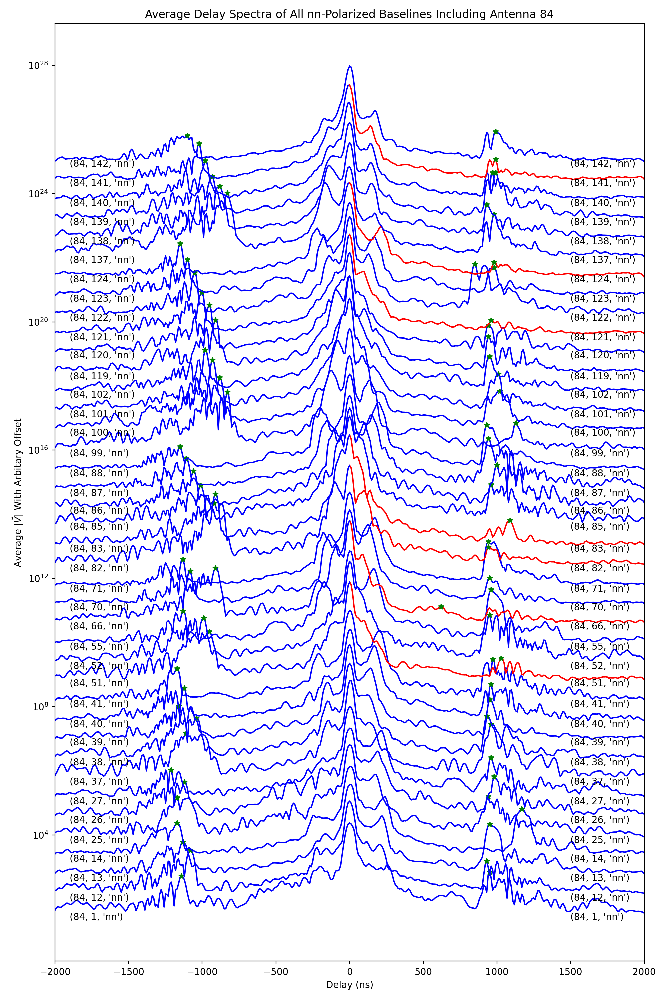

In [29]:
all_spectra()

### Figure 3: All delay spectra that involve a specific single antenna.
**Here we plot the time-averaged delay spectra of all nn-baselines that include antenna 84, some of which are conjugated so that all of them have the form `(84, X, 'nn')`, with an arbitrary offset. In our model, cross-talk at negative delays here is associated with emission from antenna 84 (via the signal chain) while cross-talk at positive delays here is received by antenna 84. Delay peaks and amplitudes are denoted with green stars at both positive and negative delays. Some baselines do not exhibit significant cross-talk ($>3\sigma$) and thus have no stars. Half-delay spectra in red correspond to antennas that do not consistently (>75% of the time) exhibit significant cross-talk in the baselines they participate in. Most of these are the RCVR antennas, not the PAM antennas (see [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf)). Red antennas were excluded from the model fits below.**


We now move to fitting all our measured cross-talk delays---not just the baselines that involve antenna 84---with a simple two or three parameter model. Namely, we model the delay observed as the light travel time from some emitter (with unknown $x$ and $y$ position) plus the light travel time down the cables, which is simply half the reflection timescale seen clearly in the autocorrelations. This fitting is performed with a simple `scipy.optimize.least_squares` fit; we leave a more sophisticated error analysis and MCMC fit to future work. In Figure 4 we show the results of this fit and the residual for a slice of the data. The fit is quite good and it places the emitter quite close to the receiverators and the correlator. 

<IPython.core.display.Javascript object>


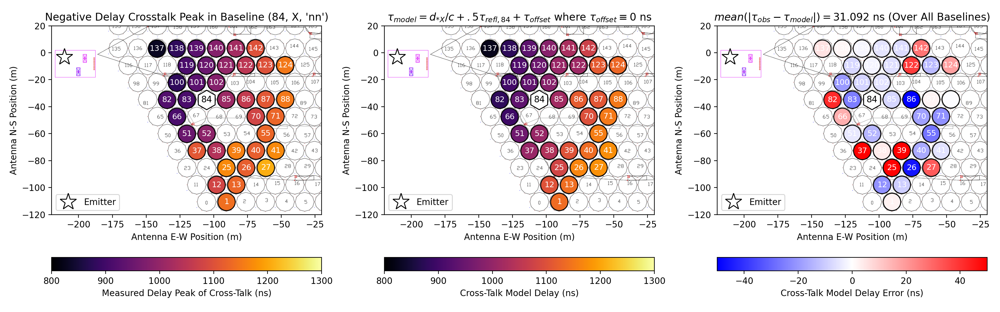

In [30]:
delay_fit(0)

### Figure 4: Delay model fit for fixed $\tau_{\text{offset}} = 0$ ns.

***Left Panel:* Here we show the peak negative cross-talk delays for baselines that involve antenna 84 (see Figure 3). In our model, these show a clear gradient away from the Western corner of the HERA hex. *Middle Panel:* Here we show modeled delays for the slice of data shown in the left panel. We have fit all significant cross-talk delays (not just those involving 84) for the position of the emitter (white star) using the cable light travel times inferred from the autocorrelation reflection delays. The position of the emitter is roughly consistent with the signal chain components in that area, namely the receiverators and the correlator hut. *Right Panel:* Here we show the slice of the model residuals corresponding to the left and middle panels. The residuals are fairly small and not surprising, given the difficulty in identifying peak delays.**

Next in Figure 5 we show the results with a single additional free parameter, a single $\tau_\text{offset}$ added to every delay. The best fit value of 122 ns is not particularly indicative of either a single transit of the 20 m cable from the receiverator to the correlator (roughly 90 ns) or two transits with a bounce (roughly 180 ns), so it is difficult to physically interpret. However, the model's preference for this offset is only very slight, since it barely decreases the mean delay error. 

<IPython.core.display.Javascript object>


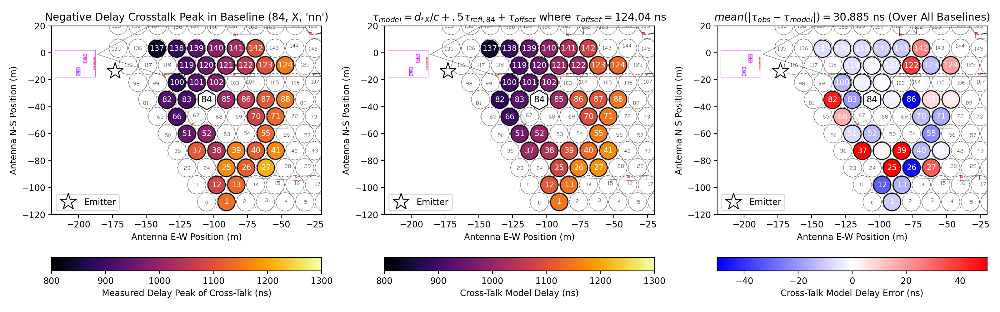

In [31]:
delay_fit(None)

### Figure 5: Delay model fit for with $\tau_{\text{offset}}$ as a free parameter.

**Here we show the same three panels as Figure 4, except now we have introduced an additional free parameter in our model: a single delay offset, corresponding to time spent in the signal chain after the ~150 m cables. This is modeled as a single delay, though in principle it could be one delay per antenna (which would introduce a lot more degrees of freedom). The difference is the residual is quite small, indicating a degeneracy between the emitter position and $\tau_{\text{offset}}$. Unfortunately, this degeneracy makes it difficult to pin down the precise source of the emission to a particular component of the signal chain.**

While the model works quite well for predicting peak delays (and as we will see later, amplitudes), it raises the very tantalizing possibility that the delay structure of $\epsilon_{ij}$ may actually be separable in a way that can be attributed to per-antenna factors rather than being a per-baseline term that must be fit by relying on its fringe rate being consistent with 0. If we take the negative delays in a plot like Figure 3 (i.e. all cross-talk proportional to a single antenna's autocorrelation) and shift them to all peak at the same point using our delay model, one might hope that the delay profiles would line up. If the entirety of the delay profile were attributable to signal chain effects before transmission, then that would happen. However, in Figure 6, we see that that is not the case. 

<IPython.core.display.Javascript object>


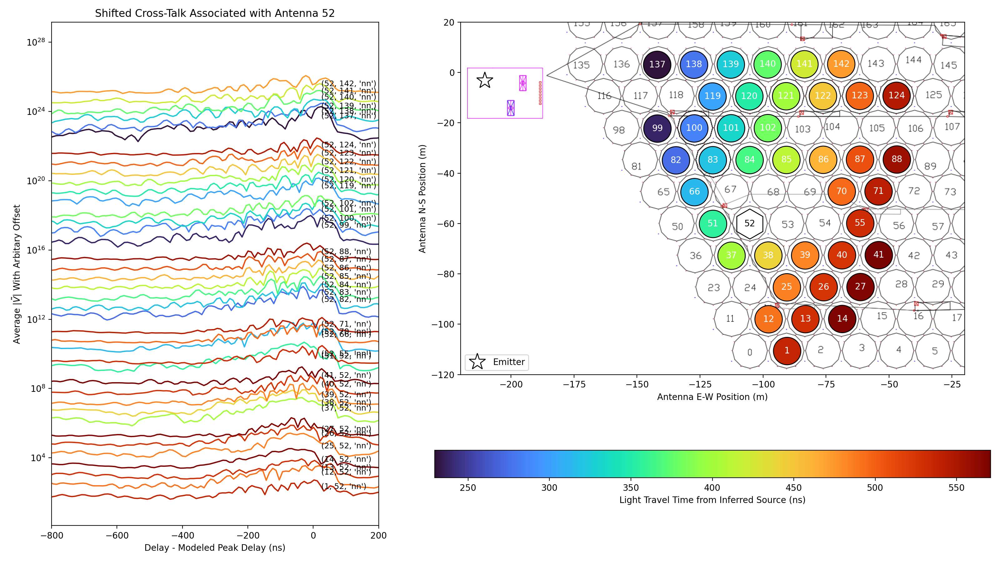

In [32]:
shifted_xtalk()

### Figure 6: Comparison of crosstalk delay profiles emitted by a single antenna.

**Here we show all the crosstalk associated in our model with emission by antenna 52 via the signal chain (left panel). Each one is shifted by the light travel time from the inferred source position (white star) so that the peak delays all line up at 0 (assuming $\tau_{\text{offset}} = 0$). While the delay profiles of the cross-talk bear some superficial similarity, especially along rows of receiving antennas (right panel). However, the profiles are different enough that it appears unlikely that the cross-talk can be modeled as a per-antenna effect rather than a per-baseline effect. This is consistent with the hypothesis that the complex delay structure is due in part to multi-path propagation of the signal from the emitter through the array--an effect that would be very difficult to model on a per-antenna basis.**

While there are some broad consistencies in the various peaks of the delay profile, there is enough baseline-to-baseline variation that this cannot easily be explained as the effects in antenna 52's signal chain before broadcasting. Further, the fact that delay profiles are more consistent within rows receiving of antennas than between rows indicates that the direction of propagation matters, likely due to beam effects near the horizon and the complex multi-path transmission the signal would have to take from the receiverators/correlator to antennas deep within the array. This may not be the last word on the topic of course, but there does not appear to be any low-hanging fruit in modeling the cross-talk in some antenna-separable fashion.

## IV. Explaining the peak amplitude of the crosstalk

The next most obvious aspect of the cross-talk which displays clear antenna-dependence is the amplitude. We see clearly that cross-talk emitted by a particular antenna appears with an amplitude that depends on the position of antenna in which it is received. This makes sense in our model, where cross-talk is created by the correlation between the electric field measured at an antenna and the same electric field that travels down the cable and then propagates over the air to the other antenna in the baseline. We might expect therefore that that the peak amplitude of $|\epsilon_{ij}|$ as a function of delay could be modeled as $A_{ij} / d^{n}$, where $A_{ij}$ is a per-antenna free parameter and the distance $d$ depends on the $x$ and $y$ positions of the source. We first try fitting with $n=1$, as we would expect from the physical argument above. The result, shown in Figure 1, explains most of the observed spatial dependence of the cross-talk amplitude with a source just inside the array. Again, without a proper error analysis and MCMC estimation of these parameters its hard to say how much stock to put in this position, though it is at least broadly consistent with the emitter locations found above with different models and almost entirely independent data.

<IPython.core.display.Javascript object>


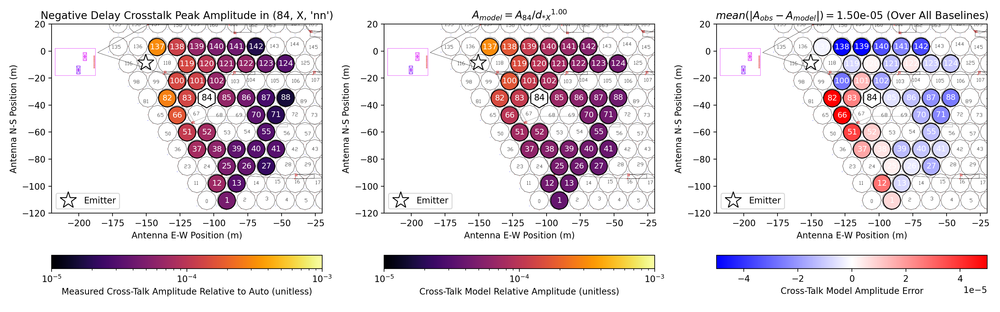

In [33]:
amp_fit(1)

### Figure 7: Amplitude model fit with electric field dropping off inversely with distance.

***Left panel:* Analogous to Figures 4 and 5, here we show the amplitude of the cross-talk in Fourier space relative to the amplitude of the autocorrelation of the emitting antenna. This is effectively a measurement of $|\epsilon(\tau_\text{peak})_{ij}|$. Again, we see a clear gradient away from the Western corner of the HERA hex. If we assume that the signal propagates freely from an emitter, we should expect that the signal should fall as 1/d since the cross-talk in the visibility is a cross-correlation from the electric field received from the sky and the same field received after bouncing around the signal chain and then being transmitted over the air. *Middle panel:* here we show a slice of our model trying to fit the contents of the left panel. This model has many more free parameters than the delay model above, since each antenna's intrinsic emission is a free parameter, though there is only one source position fit over all baselines. We see the source position is a little less consistent with the receiverators/correlators, though again there are challenges in determining precisely which peak is the right one to compare. *Right panel:* Here we see that the he model fits the data fairly well, though there may be some position-depdenent structure in the residuals.** 

That said, we do not know whether free space propagation of the electric field is the proper treatment of propagation of the signal from the emitter to each antenna, especially if that antenna is deep in the array and has no line-of-sight path to the emitter. If we add an additional free parameter, we do significantly better, as seen in Figure 8 where we show the result with the best fit of $A_{ij} \propto d^{-2.29}$. Recall, we already had one free parameter per antenna per polarization and two more for the source position, so adding one more is a very small relative increase in the size of the fit. Even more tantalizing, adopting this power law puts the location of the source extremely close to the receiverators, our mostly likely culprit. Given the clear degeneracy between the power of $d$ and the source position, it is probably wise not to read too much into happy coincidence, other than that it lends further credence to the assertion that our model self-consistently explains both the amplitude and delay of the cross-talk. That said, if any reader has a theoretical explanation for why the power should be higher than 1, we would be very curious to hear it.

<IPython.core.display.Javascript object>


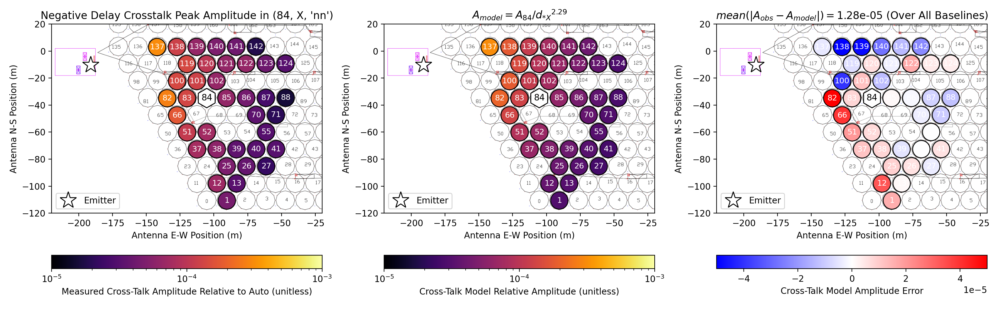

In [34]:
amp_fit(None)

### Figure 8: Amplitude model fit with electric field dropping off with a fit power law.
**Here we show the same model as in Figure 7, except now we add a signal additional free parameter: the exponent of the power law dependence on distance from the source. Perhaps coincidentally, this fit puts the source right on the recieverators, though this may be coincidence. That said, the additional free parameter yields at best fit at $A \propto d^{-2.29}$ and reduces the residuals by roughly 15%. If the power law is indeed something steeper than 1/d, this might be due to the complex propagation of the electric field through the lattice structure of the array. There's simply a lot of metal between the emitter and the dishes in question, especially further East into the array where there is certainly no line-of-sight path.**

Since the model used in Figures 7 and 8 involves a per-antenna fit for the amplitude, it was also useful to examine those solutions as a function of position in the array. This result, shown for the nn-polarization in Figure 9, is not particularly illuminating, though we include it for completeness. Some antennas are leakier than others in a way that does not depend strongly on their positions in the array. In general, signal chains with RCVRs are less leaky than signal chains with PAMs (see [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf)), though this is not universally the case. Regardless, this is consistent with our model that the emission is caused by issues further down the signal chain. 

<IPython.core.display.Javascript object>


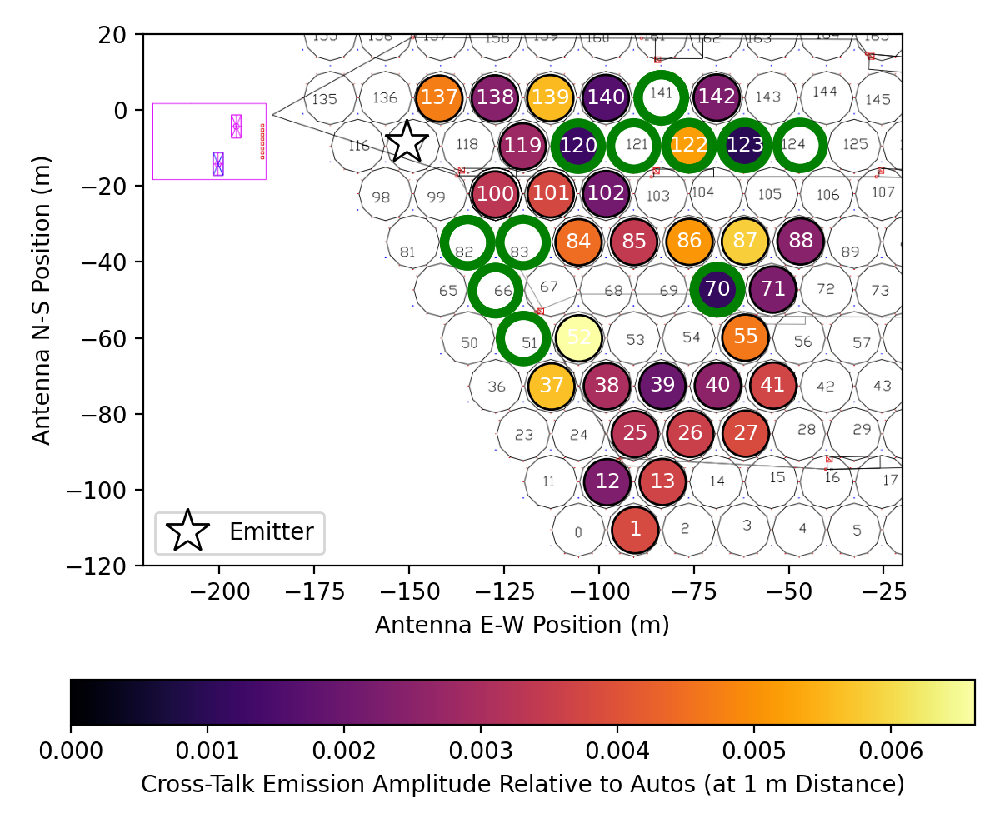

In [35]:
per_ant_amps_fit()

### Figure 9: Per-antenna amplitude model fit.
**Assuming a fixed power law of $d^{-1}$ (see Figure 7), our model also fits a per-antenna cross-talk amplitude, which would be the ampltiude measured by an antenna a 1 m distance from the emitter. Here we show those values for the nn-polarization for all antennas that consistently emitted cross-talk. The relative strength of these emitters does not depend strongly on the power of $d$. It appears the the level of emission due to each antenna varies by roughly an order of magnitude across the array without much clear pattern, except for the observation that the antennas with RCVRs (green outline) tend to have less crosstalk than antennas with PAMs (see [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf)). We also show antennas with RCVR signal chains that we excluded from the cross-talk fit. No PAM signal chains were excluded.**

## V. Conclusion

Cross-talk--autocorrelations getting introduced into cross-correlations at a relatively small amplitude and at high delay--is a major systematic for H1C analysis and the subject of two papers,
[Kern et al. (2019a)](https://arxiv.org/abs/1909.11732) and [Kern et al. (2019b)](https://arxiv.org/abs/1909.11732), supporing the H1C IDR2 limit in [HERA Collaboration (2021)](https://arxiv.org/abs/2108.02263). 

In this memo, we follow up on [HERA Memo #64](http://reionization.org/wp-content/uploads/2013/03/HERA064_reflection_memo.pdf) and demonstrate a physical model that explains both the delay and amplitude structure of the cross-talk. In each baseline, the signal is explicable as the cross correlation between each antenna's sky signal and the same signal going down the ~150 m cable and getting broadcast from a point just West of the array--likely either the receiverators or the correlator--and picked up but the other antenna. More specifically, in $V_{ij}$ the cross-talk at negative delay is due to the broadcasting of antenna $i$'s signal while the cross-talk at positive delay is due to the broadcasting of antenna $j$'s signal. While it is difficult to confirm this physically, since HERA Phase I no longer exists, this result lends credibility to the approaches taken thus far to mitigate cross-talk that rely on it being confined to a region of fringe rate space near 0, i.e. the fringe rate of the autocorrelations.

## Appendix: Code For Plots

### Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import glob
from hera_cal import io, reflections, delay_filter, smooth_cal, apply_cal, utils, datacontainer
from IPython.display import display, HTML, Image
from copy import deepcopy
from hera_cal.utils import interp_peak
import scipy
from tqdm.notebook import tqdm

%matplotlib notebook

### Load Data

In [2]:
epoch = 2

In [3]:
# figure out the correct order of files, based on a split at 4.71 radians
def file_lst_for_sort(fn):
    lst = float(fn.split('.LST.')[-1].split('.sum.')[0]) - 4.71
    if lst < 0:
        lst += 2 * np.pi
    return lst

In [4]:
df = sorted(glob.glob(f'/lustre/aoc/projects/hera/H1C_IDR3/IDR3_2/LSTBIN/epoch_{epoch}/preprocess/zen.grp1.of1.LST.*.sum.PT.uvh5'), key=file_lst_for_sort)
hd = io.HERAData(df)
hd.read(polarizations=['ee', 'nn'], return_data=False, axis='blt')

In [5]:
cals = sorted(glob.glob(f'/lustre/aoc/projects/hera/H1C_IDR3/IDR3_2/LSTBIN/epoch_{epoch}/preprocess/zen.grp1.of1.LST.*.sum.PT.allspws.refcal_smooth.calfits'), key=file_lst_for_sort)
sc = smooth_cal.CalibrationSmoother(cals)

In [6]:
F = delay_filter.DelayFilter(hd)

### Figure out cable delays from autocorrelations

In [7]:
auto_bls = [bl for bl in F.data.keys() if bl[0] == bl[1]]

In [8]:
F.fft_data(data=F.data, keys=auto_bls, assign='auto_dfft', ax='freq', window='bh', overwrite=True)

In [9]:
cable_delays = {}
for bl in F.auto_dfft:
    if bl[0] == bl[1] and bl[2] in ['ee', 'nn']:
        if not np.all(F.flags[bl]):
            indices, bin_shifts, peaks, new_peaks = interp_peak(np.where((F.delays < 900)[np.newaxis,:], 0, F.auto_dfft[bl]))
            cable_delays[bl] = np.nanmean(np.where(np.all(F.flags[bl], axis=1), np.nan, 
                                                   F.delays[indices] + np.median(np.diff(F.delays)) * bin_shifts))


invalid value encountered in true_divide
invalid value encountered in true_divide


In [10]:
# antennas to exclude based on having unusual relfections
ants_with_unusual_cables = set([utils.split_bl(bl)[0] for bl, dly in cable_delays.items() if dly > 1400 or dly < 1000])
print(ants_with_unusual_cables)

{(99, 'Jnn'), (14, 'Jnn'), (14, 'Jee'), (99, 'Jee')}


### Apply Calibration

In [11]:
apply_cal.calibrate_in_place(F.data, sc.gain_grids, F.flags, sc.flag_grids)

invalid value encountered in true_divide
invalid value encountered in true_divide


### FFT all baselines 

In [12]:
F.fft_data(data=F.data, assign='dfft', ax='freq', window='bh', overwrite=True, edgecut_hi=100, edgecut_low=100)

In [13]:
lsts = np.unwrap(F.lsts)*24/2/np.pi
while np.max(lsts) > 24:
    lsts -= 24

In [14]:
def xtalk_example():
    fig, axes = plt.subplots(1,2, figsize=(12,5))
    bl = (52, 87, 'nn')
    extent=[F.delays[0], F.delays[-1], lsts[-1], lsts[0]]
    for i, ax in enumerate(axes):
        if i == 0:
            im = ax.imshow(np.abs(F.dfft[bl]), norm=matplotlib.colors.LogNorm(vmin=1e-1, vmax=1e4), cmap='inferno', aspect='auto',
                           extent=extent, interpolation='nearest')
        elif i == 1:
            im = ax.imshow(np.real(F.dfft[bl]), cmap='bwr', aspect='auto', extent=extent, vmax=300, vmin=-300, interpolation='nearest')
        plt.colorbar(im, ax=ax, label=['$|\\tilde{V}|$', 'Re$(\\tilde{V})$'][i])
        ax.set_xlabel('Delay (ns)')
        ax.set_ylabel('LST (hours)')
        ax.set_xlim([-2000, 2000])
        ax.set_title(f'H1C IDR3.2 Epoch {epoch}: {bl}')
    plt.tight_layout()

In [15]:
avg_auto_spectra = {bl: np.nanmean(np.where(F.flags[bl], np.nan, np.abs(F.dfft[bl])), axis=0) for bl in auto_bls}

Mean of empty slice


### Figure out peak amplitudes and delays of significant cross-talk

In [16]:
xtalk_signficance = 3

neg_dly_max = {}
neg_xtalk_peak = {}
pos_dly_max = {}
pos_xtalk_peak = {}

for bl in tqdm(F.dfft):
    if bl[0] != bl[1]:

        avg_spectrum = np.nanmean(np.where(F.flags[bl], np.nan, np.abs(F.dfft[bl])), axis=0)
        if not np.any(np.isfinite(avg_spectrum)):
            continue
            
        noise_dlys = ((F.delays > -3000) & (F.delays < -2000)) | ((F.delays < 3000) & (F.delays > 2000))
        noise_floor = np.nanmean(avg_spectrum[noise_dlys])
        
        max_pos_ind = np.argmax(np.where(F.delays > 600, avg_spectrum, 0))
        if avg_spectrum[max_pos_ind] > xtalk_signficance * noise_floor:
            pos_dly_max[bl] = F.delays[max_pos_ind]
            pos_xtalk_peak[bl] = avg_spectrum[max_pos_ind] / np.max(np.abs(avg_auto_spectra[bl[1], bl[1], bl[2]]))
        else:
            pos_dly_max[bl] = np.nan
            pos_xtalk_peak[bl] = np.nan

        max_neg_ind = np.argmax(np.where(F.delays < -600, avg_spectrum, 0))
        if avg_spectrum[max_neg_ind] > xtalk_signficance * noise_floor:
            neg_dly_max[bl] = F.delays[max_neg_ind]
            neg_xtalk_peak[bl] = avg_spectrum[max_neg_ind] / np.max(np.abs(avg_auto_spectra[bl[0], bl[0], bl[2]]))
        else:
            neg_dly_max[bl] = np.nan
            neg_xtalk_peak[bl] = np.nan

Mean of empty slice


### Figure out which antennas have consistent enough cross-talk to be included in the model
(Many of those excluded have RCVRs rather than PAMs... the PAMs seem to produce worse cross-talk though not always.)

In [17]:
ants = set(ant for bl in neg_dly_max for ant in utils.split_bl(bl))
significant_delays_by_ant = {ant: [] for ant in ants}
for bl in neg_dly_max:
    ant1, ant2 = utils.split_bl(bl)
    significant_delays_by_ant[ant1].append(neg_dly_max[bl])
    significant_delays_by_ant[ant2].append(pos_dly_max[bl])    

In [18]:
ants_to_use_threshold = .7
ants_with_significant_xtalk = [ant for ant, delays in significant_delays_by_ant.items()
                               if np.mean(np.isfinite(delays)) > ants_to_use_threshold]

In [19]:
RCVR_ants = [51, 65, 66, 70, 82, 83, 98, 120, 121, 122, 123, 124, 141, 143]

# plt.figure()
# plt.scatter([ant[0] for ant in significant_delays_by_ant], 
#             [np.mean(np.isfinite(significant_delays_by_ant[ant])) for ant in significant_delays_by_ant], 
#             c=[ant[0] in RCVR_ants for ant in significant_delays_by_ant])
# plt.axhline(ants_to_use_threshold)
# plt.ylabel('Fraction with Significant Crosstalk')
# plt.xlabel('Antenna Index')

In [20]:
def all_spectra():
    refant = 84

    plt.figure(figsize=(10,15))
    i = 1
    for bl in list(F.dfft.keys()):
        if (refant in bl) and (bl[0] != bl[1]) and not np.all(F.flags[bl]) and bl[2] == 'nn':
            i *= 4
            avg_spectrum = i * np.nanmean(np.where(F.flags[bl], np.nan, np.abs(F.dfft[bl])), axis=0)
            if bl[0] == refant:
                plt.semilogy(F.delays[F.delays<=0], avg_spectrum[F.delays<=0], c=['r', 'b'][utils.split_bl(bl)[0] in ants_with_significant_xtalk])
                plt.semilogy(F.delays[F.delays>=0], avg_spectrum[F.delays>=0], c=['r', 'b'][utils.split_bl(bl)[1] in ants_with_significant_xtalk])
                if np.isfinite(neg_dly_max[bl]):
                    plt.plot(neg_dly_max[bl], avg_spectrum[F.delays == neg_dly_max[bl]], 'g*')
                if np.isfinite(pos_dly_max[bl]):
                    plt.plot(pos_dly_max[bl], avg_spectrum[F.delays == pos_dly_max[bl]], 'g*')            
            else:
                plt.semilogy(-F.delays[F.delays<=0], avg_spectrum[F.delays<=0], c=['r', 'b'][utils.split_bl(bl)[0] in ants_with_significant_xtalk])
                plt.semilogy(-F.delays[F.delays>=0], avg_spectrum[F.delays>=0], c=['r', 'b'][utils.split_bl(bl)[1] in ants_with_significant_xtalk])            
                if np.isfinite(neg_dly_max[bl]):
                    plt.plot(-neg_dly_max[bl], avg_spectrum[F.delays == neg_dly_max[bl]], 'g*')
                if np.isfinite(pos_dly_max[bl]):
                    plt.plot(-pos_dly_max[bl], avg_spectrum[F.delays == pos_dly_max[bl]], 'g*')               
                bl = utils.reverse_bl(bl)

            plt.text(-1900, np.min(avg_spectrum)*.9, bl)
            plt.text(1500, np.min(avg_spectrum)*.9, bl)


    plt.xlim([-2000, 2000])
    plt.xlabel('Delay (ns)')
    plt.ylabel('Average $|\\tilde{V}|$ With Arbitary Offset')
    plt.title(f'Average Delay Spectra of All nn-Polarized Baselines Including Antenna {refant}')

    plt.tight_layout()


### Model delay slope as over-the-air cross-talk

In [21]:
import scipy

global fixed_offset

def delay_model(params):
    src_x, src_y, offset_tau = params

    bls = [bl for bl in neg_dly_max]
    dly_peaks = np.array([[pos_dly_max[bl], -neg_dly_max[bl]] for bl in bls]).flatten()

    xs = np.array([F.antpos[ant][0] for bl in bls for ant in bl[0:2]])
    ys = np.array([F.antpos[ant][1] for bl in bls for ant in bl[0:2]])    
    dists = np.sqrt((xs - src_x)**2 + (ys - src_y)**2)
    
    half_cables = np.array([cable_delays[ant, ant, bl[2]] / 2 for bl in bls for ant in bl[0:2]])
    if fixed_offset is None:
        offsets = np.array([offset_tau for bl in bls for ant in bl[0:2]])
    else: 
        offsets = np.array([fixed_offset for bl in bls for ant in bl[0:2]])

    # exclude antennas with poorly measured crosstalks or suspicious delays
    to_use = np.array([(ant in ants_with_significant_xtalk) for bl in bls for ant in utils.split_bl(bl)[::-1]])
    to_use &= np.array([(ant not in ants_with_unusual_cables) for bl in bls for ant in utils.split_bl(bl)])
    to_use &= np.array([(ant not in ants_with_unusual_cables) for bl in bls for ant in utils.split_bl(bl)[::-1]])
    to_use &= np.isfinite(dly_peaks)
    
    ants1 = np.array([bl[0] for bl in bls for ant in bl[0:2]])
    ants2 = np.array([bl[1] for bl in bls for ant in bl[0:2]])    
    
    times = dists / scipy.constants.c * 1e9
    model = times + half_cables + offsets
    
    return (model - dly_peaks)[to_use]

In [22]:
def delay_fit(offset_to_use):
    global fixed_offset
    fixed_offset = offset_to_use
    refant = 84
    refpol = 'nn'
    im = plt.imread('heraSite.png')

    fig, axes = plt.subplots(1,3, figsize=(16,5))

    for i, ax in enumerate(axes):
        ax.imshow(im, extent=[-2.1637e+2*1.005, 1.2787e+2*.993, -1.1800e+2, 1.4243e+2])


        src_x, src_y, fit_tau = scipy.optimize.least_squares(delay_model, [-200, 10, 200], method='trf').x
        if fixed_offset is not None:
            fit_tau = fixed_offset
        mean_error = np.mean(np.abs(delay_model((src_x, src_y, fit_tau))))

        bls = [bl for bl in neg_dly_max if (bl[2]==refpol) and refant in bl]
        bls = [bl for bl in bls if not np.any([ant in ants_with_unusual_cables for ant in utils.split_bl(bl)])]
        antnums = [ant for bl in bls for ant in bl[0:2] if ant != refant]
        xs = np.array([F.antpos[ant][0] for bl in bls for ant in bl[0:2] if ant != refant])
        ys = np.array([F.antpos[ant][1] for bl in bls for ant in bl[0:2] if ant != refant])

        obs_dlys = np.array([-neg_dly_max[bl] if bl[0] == refant else pos_dly_max[bl] for bl in bls])    
        model_times = np.sqrt((xs - src_x)**2 + (ys - src_y)**2) / scipy.constants.c * 1e9
        model_times += np.array([cable_delays[ant, ant, refpol] / 2 for ant in antnums]) + fit_tau

        if i == 0:
            scatter = ax.scatter(xs, ys, c=obs_dlys, s=400, cmap='inferno',  edgecolors='k', vmin=800, vmax=1300)
            plt.colorbar(scatter, ax=ax, label='Measured Delay Peak of Cross-Talk (ns)', location='bottom')
            ax.set_title(f"Negative Delay Crosstalk Peak in Baseline ({refant}, X, '{refpol}')")
        if i == 1:
            scatter = ax.scatter(xs, ys, c=model_times, s=400, cmap='inferno',  edgecolors='k', vmin=800, vmax=1300)
            plt.colorbar(scatter, ax=ax, label='Cross-Talk Model Delay (ns)', location='bottom')
            ax.set_title('$\\tau_{model} = d_{*X} / c + .5$' +  '$\\tau_{{{}}} +$'.format(f'refl,{refant}')  + '$\\tau_{offset}$ where $\\tau_{offset}$' + ['$=$','$\\equiv$'][fixed_offset is not None] + f'{np.round(fit_tau,2)} ns' )
        if i == 2:
            scatter = ax.scatter(xs, ys, c=obs_dlys - model_times, s=400, cmap='bwr',  edgecolors='k', vmin=-50, vmax=50)#, vmin=800, vmax=1300)
            plt.colorbar(scatter, ax=ax, label='Cross-Talk Model Delay Error (ns)', location='bottom')
            ax.set_title('$mean(|\\tau_{obs} - \\tau_{model}|) =$' + f'{np.round(mean_error,3)} ns (Over All Baselines)' )


        for x, y, antnum in zip(xs, ys, antnums):
            ax.text(x, y, antnum,  c='w', va='center', ha='center', fontsize=9)
        ax.scatter([F.antpos[refant][0]], [F.antpos[refant][1]], marker='h', s=500, c='w', edgecolors='k')
        ax.text(F.antpos[refant][0], F.antpos[refant][1], refant, va='center', ha='center')

        ax.plot([src_x], [src_y], '*', ms=20, c='w', mec='k', label='Emitter')
        ax.legend(loc='lower left')
        ax.set_xlabel('Antenna E-W Position (m)')
        ax.set_ylabel('Antenna N-S Position (m)')        

        ax.set_xlim([-220, -20])
        ax.set_ylim(-120, 20)    

    plt.tight_layout()
    if fixed_offset is None:
        plt.savefig('Crosstalk_Model_Floating_Offset.pdf')
    else:        
        plt.savefig(f'Crosstalk_Model_Offset_{fixed_offset}.pdf')        




In [23]:
def shifted_xtalk():
    refant = 52
    refpol = 'nn'

    fig, axes = plt.subplots(1,2,figsize=(16,9), gridspec_kw={'width_ratios': [1, 1.7]})

    global fixed_offset
    fixed_offset = 0
    src_x, src_y, fit_tau = scipy.optimize.least_squares(delay_model, [-200, 10, 200], method='trf').x

    im = plt.imread('heraSite.png')

    ax = axes[1]
    ax.imshow(im, extent=[-2.1637e+2*1.005, 1.2787e+2*.993, -1.1800e+2, 1.4243e+2])


    bls = [bl for bl in neg_dly_max if (bl[2]==refpol) and refant in bl]
    # bls = [bl for bl in bls if not np.any([ant in ants_with_unusual_cables for ant in utils.split_bl(bl)])]
    antnums = [ant for bl in bls for ant in bl[0:2] if ant != refant]
    xs = np.array([F.antpos[ant][0] for bl in bls for ant in bl[0:2] if ant != refant])
    ys = np.array([F.antpos[ant][1] for bl in bls for ant in bl[0:2] if ant != refant])

    ltts = np.sqrt((xs - src_x)**2 + (ys - src_y)**2) / scipy.constants.c * 1e9

    scatter = ax.scatter(xs, ys, c=ltts, s=1000, cmap='turbo',  edgecolors='k')
    plt.colorbar(scatter, ax=ax, label='Light Travel Time from Inferred Source (ns)', location='bottom')

    for x, y, antnum in zip(xs, ys, antnums):
        ax.text(x, y, antnum,  c='w', va='center', ha='center', fontsize=10)
    ax.scatter([F.antpos[refant][0]], [F.antpos[refant][1]], marker='h', s=1200, c='w', edgecolors='k')
    ax.text(F.antpos[refant][0], F.antpos[refant][1], refant, va='center', ha='center')

    ax.plot([src_x], [src_y], '*', ms=20, c='w', mec='k', label='Emitter')
    ax.legend(loc='lower left')
    ax.set_xlabel('Antenna E-W Position (m)')
    ax.set_ylabel('Antenna N-S Position (m)')        

    ax.set_xlim([-220, -20])
    ax.set_ylim(-120, 20)    

    ax = axes[0]
    i = 1
    for bl in list(F.dfft.keys()):
        if (refant in bl) and (bl[0] != bl[1]) and not np.all(F.flags[bl]) and bl[2] == refpol:
            i *= 4
            avg_spectrum = i * np.nanmean(np.where(F.flags[bl], np.nan, np.abs(F.dfft[bl])), axis=0)


            other_ant = [ant for ant in bl[0:2] if ant != refant][0]
            ltt = np.sqrt((F.antpos[other_ant][0] - src_x)**2 + (F.antpos[other_ant][1] - src_y)**2) / scipy.constants.c * 1e9

            c=plt.cm.turbo((ltt-np.min(ltts))/(np.max(ltts) - np.min(ltts)))

            if bl[0] == refant:
                dlys = F.delays + ltt + cable_delays[refant, refant, refpol]/2
                ax.semilogy(dlys, avg_spectrum, c=c)
                ax.text(25, np.mean(avg_spectrum[(dlys > 0) & (dlys < 200)]), bl, fontsize=9)

            else:
                dlys = -F.delays + ltt + cable_delays[refant, refant, refpol]/2
                ax.semilogy(dlys, avg_spectrum, c=c)
                ax.text(25, np.mean(avg_spectrum[(dlys > 0) & (dlys < 200)]), bl, fontsize=9)            
                bl = utils.reverse_bl(bl)




    ax.set_xlim([-800, 200])
    ax.set_xlabel('Delay - Modeled Peak Delay (ns)')
    ax.set_ylabel('Average $|\\tilde{V}|$ With Arbitary Offset')
    ax.set_title(f'Shifted Cross-Talk Associated with Antenna {refant}')

    plt.tight_layout()


### Model amplitude as over-the-air cross-talk

In [24]:
ant_to_ind = {ant: i for i, ant in enumerate(sorted(set([ant for bl in neg_xtalk_peak for ant in utils.split_bl(bl)])))}

global fixed_power
fixed_power = None

def amp_model(params):
    src_x, src_y, power = params[0:3]
    per_ant_amp = params[2:]

    bls = [bl for bl in neg_xtalk_peak]
    xtalk_amps = np.array([[pos_xtalk_peak[bl], neg_xtalk_peak[bl]] for bl in bls]).flatten()

    xs = np.array([F.antpos[ant][0] for bl in bls for ant in bl[0:2]])
    ys = np.array([F.antpos[ant][1] for bl in bls for ant in bl[0:2]])  
    dists = np.sqrt((xs - src_x)**2 + (ys - src_y)**2)
    
    base_amplitudes = np.array([per_ant_amp[ant_to_ind[ant]] for bl in bls for ant in utils.split_bl(bl)[::-1]])
    if fixed_power is None:
        model = base_amplitudes / dists**power
    else:
        model = base_amplitudes / dists**fixed_power
    
    # exclude antennas with poorly measured crosstalks or suspicious delays
    to_use = np.array([(ant in ants_with_significant_xtalk) for bl in bls for ant in utils.split_bl(bl)[::-1]])
    to_use &= np.array([(ant not in ants_with_unusual_cables) for bl in bls for ant in utils.split_bl(bl)])
    to_use &= np.array([(ant not in ants_with_unusual_cables) for bl in bls for ant in utils.split_bl(bl)[::-1]])
    to_use &= np.isfinite(xtalk_amps)
        
    return (model - xtalk_amps)[to_use]

In [25]:
def amp_fit(select_power):

    global fixed_power
    fixed_power = select_power
    
    refant = 84
    refpol = 'nn'
    im = plt.imread('heraSite.png')

    fig, axes = plt.subplots(1,3, figsize=(16,5))
    fit = scipy.optimize.least_squares(amp_model, [-200, 10, 1] + [1] * len(ant_to_ind), method='trf').x
    src_x, src_y, power = fit[0:3]
    if fixed_power is not None:
        power = fixed_power
    per_ant_amps = {ant: fit[ant_to_ind[ant] + 2] for ant in ant_to_ind}

    for i, ax in enumerate(axes):
        ax.imshow(im, extent=[-2.1637e+2*1.005, 1.2787e+2*.993, -1.1800e+2, 1.4243e+2])

        bls = [bl for bl in neg_dly_max if (bl[2]==refpol) and refant in bl]
        bls = [bl for bl in bls if not np.any([ant in ants_with_unusual_cables for ant in utils.split_bl(bl)])]
        antnums = [ant for bl in bls for ant in bl[0:2] if ant != refant]
        xs = np.array([F.antpos[ant][0] for bl in bls for ant in bl[0:2] if ant != refant])
        ys = np.array([F.antpos[ant][1] for bl in bls for ant in bl[0:2] if ant != refant])

        obs_amps = np.array([neg_xtalk_peak[bl] if bl[0] == refant else pos_xtalk_peak[bl] for bl in bls])    

        model_amps = np.array([per_ant_amps[refant, utils.split_pol(refpol)[0]] for bl in bls])
        model_amps /= ((xs - src_x)**2 + (ys - src_y)**2)**(.5 * power)

        mean_error = np.mean(np.abs(amp_model(fit)))

        if i == 0:
            scatter = ax.scatter(xs, ys, c=obs_amps, s=400, cmap='inferno',  edgecolors='k', norm=matplotlib.colors.LogNorm(vmin=1e-5, vmax=1e-3, ))
            plt.colorbar(scatter, ax=ax, label='Measured Cross-Talk Amplitude Relative to Auto (unitless)', location='bottom')
            ax.set_title(f"Negative Delay Crosstalk Peak Amplitude in ({refant}, X, '{refpol}')")
        if i == 1:
            scatter = ax.scatter(xs, ys, c=model_amps, s=400, cmap='inferno',  edgecolors='k', norm=matplotlib.colors.LogNorm(vmin=1e-5, vmax=1e-3, ))
            plt.colorbar(scatter, ax=ax, label='Cross-Talk Model Relative Amplitude (unitless)', location='bottom')
            ax.set_title('$A_{model} = $' + f'$A_{{{refant}}}$' + '$/ d_{*X}$' + f'$^{{{power:.2f}}}$')
        if i == 2:
            scatter = ax.scatter(xs, ys, c=obs_amps - model_amps, s=400, cmap='bwr',  edgecolors='k', vmin=-5e-5, vmax=5e-5)
            plt.colorbar(scatter, ax=ax, label='Cross-Talk Model Amplitude Error', location='bottom')
            ax.set_title('$mean(|A_{obs} - A_{model}|) =$' + f'{mean_error:.2e} (Over All Baselines)' )


        for x, y, antnum in zip(xs, ys, antnums):
            ax.text(x, y, antnum,  c='w', va='center', ha='center', fontsize=9)
        ax.scatter([F.antpos[refant][0]], [F.antpos[refant][1]], marker='h', s=500, c='w', edgecolors='k')
        ax.text(F.antpos[refant][0], F.antpos[refant][1], refant, va='center', ha='center')

        ax.plot([src_x], [src_y], '*', ms=20, c='w', mec='k', label='Emitter')
        ax.legend(loc='lower left')
        ax.set_xlabel('Antenna E-W Position (m)')
        ax.set_ylabel('Antenna N-S Position (m)')        

        ax.set_xlim([-220, -20])
        ax.set_ylim(-120, 20)    

    plt.tight_layout()

In [26]:
def per_ant_amps_fit():

    refpol = 'Jnn'
    im = plt.imread('heraSite.png')

    fig, ax = plt.subplots(1,1, figsize=(6,5))

    global fixed_power
    fixed_power = 1
    fit = scipy.optimize.least_squares(amp_model, [-200, 10, 1] + [1] * len(ant_to_ind), method='trf').x
    src_x, src_y, power = fit[0:3]
    per_ant_amps = {ant: fit[ant_to_ind[ant] + 2] for ant in ant_to_ind}

    ax.imshow(im, extent=[-2.1637e+2*1.005, 1.2787e+2*.993, -1.1800e+2, 1.4243e+2])

    ants = [ant for ant in per_ant_amps if (ant not in ants_with_unusual_cables) and (ant in ants_with_significant_xtalk) and (ant[1] == refpol)]

    xs = np.array([F.antpos[ant[0]][0] for ant in ants])
    ys = np.array([F.antpos[ant[0]][1] for ant in ants])
    amps = [per_ant_amps[ant] for ant in ants]
    is_RCVR = [ant[0] in RCVR_ants for ant in ants]

    scatter = ax.scatter(xs, ys, c=amps, s=400, cmap='inferno',  edgecolors=[['k','g'][is_r] for is_r in is_RCVR], 
                         linewidths=[[1,4][is_r] for is_r in is_RCVR], vmin=0, vmax=np.max(amps))
    plt.colorbar(scatter, ax=ax, label='Cross-Talk Emission Amplitude Relative to Autos (at 1 m Distance)', location='bottom')

    for x, y, ant in zip(xs, ys, ants):
        ax.text(x, y, ant[0],  c='w', va='center', ha='center', fontsize=9)

    other_rcvr = [ant for ant in per_ant_amps if (ant[0] in RCVR_ants) and ((ant in ants_with_unusual_cables) or (ant not in ants_with_significant_xtalk))]
    xs = np.array([F.antpos[ant[0]][0] for ant in other_rcvr])
    ys = np.array([F.antpos[ant[0]][1] for ant in other_rcvr])
    scatter = ax.scatter(xs, ys, c='none', s=400, cmap='inferno', edgecolors='g', 
                         linewidths=4, vmin=0, vmax=np.max(amps))
    
        
    ax.plot([src_x], [src_y], '*', ms=20, c='w', mec='k', label='Emitter')
    ax.legend(loc='lower left')
    ax.set_xlabel('Antenna E-W Position (m)')
    ax.set_ylabel('Antenna N-S Position (m)')        

    ax.set_xlim([-220, -20])
    ax.set_ylim(-120, 20)    

    plt.tight_layout()